# Mars

The following packages will need to be installed in the Anaconda environment to run the following script if they are not already there. Assuming a Python version 3.7 setup, run the following commands from the Anaconda terminal window to install any missing packages.


conda install -c anaconda beautifulsoup4,

conda install -c anaconda pillow,

conda install -c anaconda ipython,

conda install -c ulmo urllib3,

conda install -c anaconda scipy

conda install -c conda-forge cartopy


# Module Imports

In [1]:
#Import modules necessary for this script
from matplotlib import pyplot as plt
import os
import urllib.request
import csv
import pandas as pd 
import json
from PIL import Image
import IPython
from IPython.display import IFrame
from IPython.display import YouTubeVideo
import requests
from bs4 import BeautifulSoup
from scipy.stats import pearsonr
from scipy.stats import iqr
import cartopy.crs as ccrs

# Functions

In [127]:
# State functions to be used in script

def get_mars_weather_data(max_sol=1000): #a function to call the API which requests information on Mars atmospheric conditions as recoreded by the Curiosity Rover
    sols=range(0, max_sol, 1) #create range of sols (Martian days) to iterate through
    #create empty dataframe to be filled
    mars_weather=pd.DataFrame(columns=['sol', 'air_temp_min', 'air_temp_max', 'air_temp_mean', 'air_pres_min', 'air_pres_max', 'air_pres_mean', 'wind_speed_min', 'wind_speed_max', 'wind_speed_mean'])
    for sol in sols:
        url = 'https://api.mars.spacexcompanion.app/v1/sols/'+ str(sol) #define the API, iterating through each sol (Mars day)
        response = urllib.request.urlopen(url) #request data pull using the API
        raw_json = response.read().decode("utf-8") #read and decode the website's response to the request into raw json format
        data = json.loads(raw_json) #parse the JSON, converting it from a string into a Python data structure
        if len(data)<4: #if the length of the data returned is less than four, all that has been returned is an error message saying there is no available data for that sol
            print('for sol %d there is no data' %sol) #inform user for which sols there is no available data
        else:
            #create a pandas series with the same index as the columns in the mars_weather dataframe with the info gathered from the API
            to_append=pd.Series([data['sol'], data['air']['temperature']['minimum'], data['air']['temperature']['maximum'], data['air']['temperature']['average'], data['air']['pressure']['minimum'], data['air']['pressure']['maximum'], data['air']['pressure']['average'],  data['wind']['speed']['minimum'], data['wind']['speed']['maximum'], data['wind']['speed']['average']], index=mars_weather.columns)
            mars_weather=mars_weather.append([to_append]) #add results onto the dataframe for that sol
    mars_weather=mars_weather.reset_index(drop=True) #give the dataframe a new index once all of the information for the specified range of sols has been gathered
    return mars_weather #return filled dataframe

def get_mars_weather_data_take_2():
    url='https://pudding.cool/2017/12/mars-data/marsWeather.json'
    response = urllib.request.urlopen(url) #request data pull using the API
    raw_json = response.read().decode("utf-8") #read and decode the website's response to the request into raw json format
    data = json.loads(raw_json) #parse the JSON, converting it from a string into a Python data structure
    mars_weather=pd.DataFrame(columns=['sol',  'terrestrial_date', 'air_temp_min', 'air_temp_max', 'pressure', 'month'])
    for data_per_sol in data:
        if len(data_per_sol)<4: #if the length of the data returned is less than four, all that has been returned is an error message saying there is no available data for that sol
            print('for sol %d there is no data' %sol) #inform user for which sols there is no available data
        else:
            #create a pandas series with the same index as the columns in the mars_weather dataframe with the info gathered from the API
            to_append=pd.Series([data_per_sol['sol'], data_per_sol['terrestrial_date'], data_per_sol['min_temp'], data_per_sol['max_temp'], data_per_sol['pressure'],data_per_sol['season']], index=mars_weather.columns)
            mars_weather=mars_weather.append([to_append]) #add results onto the dataframe for that sol
    mars_weather=mars_weather.reset_index(drop=True) #give the dataframe a new index once all of the information for the specified range of sols has been gathered
    mars_weather['month']=mars_weather['month'].str.replace(r'Month ', '').astype(int) #replace string describing month for an integer monthly value, will be necessary for groupby function later on
    return mars_weather #return filled dataframe
    

def save_as_csv(df, filepath='mars_weather.csv'): #a function to save a dataframe, with default filepath specified
    try:
        df.to_csv(filepath)
    except:
        print('this file is unable to be saved to filepath %s' %filepath) #error handling
    return 

#a function to display a number of images from the curiosity rover from its cameras on a given martian day
def display_curiosity_images(sol=1500, cameras=['fhaz', 'rhaz', 'mast', 'mahli', 'mardi', 'navcam'], num_images=1): 
    for camera in cameras: #iterate through each of the Curiosity Rover's Cameras
        url='https://api.nasa.gov/mars-photos/api/v1/rovers/curiosity/photos?sol=%d&camera=%s&api_key=RIy54pU85NfSQyqUvDCOL7yicTtcBwwJ5ibxrg5v'%(sol, camera)
        response = urllib.request.urlopen(url) #request data pull using the API
        raw_json = response.read().decode("utf-8") #read and decode the website's response to the request into raw json format
        data = json.loads(raw_json) #parse the JSON, converting it from a string into a Python data structure
        num_images=min(num_images, len(data['photos'])) #the number of images is the minimum of the number of images requested and the number returned
        for i in range(num_images): #iterate through the json dictionary
            photo_url=data['photos'][i]['img_src'] #get the photo url for each retrived image url
            display(Image.open(urllib.request.urlopen(photo_url))) #display retrieved images
            
def display_curiosity_self_portrait(): #function to display image of Curiosity Rover it took of itself from the Jet Propulsion Laboratory website
    url='https://www.jpl.nasa.gov/spaceimages/images/largesize/PIA19808_hires.jpg'
    display(Image.open(urllib.request.urlopen(url))) #display retrieved image
    
def display_mars_surface():
    url='https://www.jpl.nasa.gov/spaceimages/images/largesize/PIA16105_hires.jpg' #function to display image of Martian surface from the Jet Propulsion Laboratory website
    display(Image.open(urllib.request.urlopen(url))) #display retrieved image
    
def display_devon_island():
    url='https://cdn.mos.cms.futurecdn.net/qfJPBBRFcReTTTbL8qkgaa-650-80.jpg' #function to display image of Devon Island Canada for comparison to Mars surface
    img=Image.open(urllib.request.urlopen(url)) #retrieve image from url  
    width = 1200 #assign variable to be used for changing image width
    height = 800 #assign variable to be used for changing image height
    img = img.resize((width,height), Image.ANTIALIAS) #resize image
    display(img) #display image
    
def display_the_red_planet(): #function to display interactive 3D image of Mars available on the NASA website
    display(IFrame(src="https://solarsystem.nasa.gov/gltf_embed/2372", width="100%", height="450px")) 
    
def mars_key_facts(key_words=['Romans', 'Mars', 'Red', 'atmosphere', 'temperature', 'winds', 'living things']): #function to parse info about Mars from the NASA website
    url = 'https://solarsystem.nasa.gov/planets/mars/in-depth/#atmosphere_otp'
    html = urllib.request.urlopen(url).read() #read html code retrieved from calling the url
    soup = BeautifulSoup(html, 'html.parser') #use the BeautifulSoup package to parse the html code

    print('Key Facts About Mars - The Red Planet \n')
    your_data = list() #initiate list that will store retrieved facts
    fact_number=1 #initiate the counting of fact numbers
    for line in soup.findAll('span'): #the findAll method traverses the tree, starting at the given point, and finds all the Tag and NavigableString objects that match the criteria you give, in this case 'span'
        for word in key_words: #loop through keywords
            if (word in line.text)&(~('{' in line.text)): #check that the keyword is contained in the line of text parsed and that line of text hasn't already been printed
                if (len(line.text)>1)&(~(line.text in your_data)): #check that there is more than one word in the line of text and that it doesn't contain characters that might indicate it isn't a coherent sentence to the user
                    if (line.text[0].isupper())&((line.text[-1]=='.')|(line.text[-2]=='.')): #Check that the first letter is uppercase and last character is full stop to indicate a full, coherent sentence that is readable to the user
                        print((fact_number), '.', line.text, '\n \n') #if the criteria is met, print the fact
                        fact_number+=1 #move onto next fact number
                        your_data.append(line.text) #add the fact onto the list of facts
                        
def sounds_of_mars():
    display(YouTubeVideo('1PtdjFnY64M', width=1200, height=800)) #Use the IPython Display package to display Youtube video of the first Martian sounds detected by the Insight Rover
    
def loss_of_mars_atmosphere():
    display(YouTubeVideo('fLJhGQmnM_w', width=1200, height=800)) #Use the IPython Display package to display Youtube video of how Mars may have lost its atmosphere, as published by NASA
    
def get_max_sol(): #function to find the most recent Martian sol from which photos exist for the Mars Curiosity Rover
    url='https://api.nasa.gov/mars-photos/api/v1/manifests/curiosity?&api_key=RIy54pU85NfSQyqUvDCOL7yicTtcBwwJ5ibxrg5v'
    response = urllib.request.urlopen(url) #request data pull using the API
    raw_json = response.read().decode("utf-8") #read and decode the website's response to the request into raw json format
    data = json.loads(raw_json) #parse the JSON, converting it from a string into a Python data structure
    max_sol=data['photo_manifest']['max_sol']#get the maximum Martian day for which photos exist
    return max_sol #return this value

def get_locational_current_temp_and_compare(lat, lon, place_name, comparison_temp, comparison_press, comparison_place):
    #use open weather map to get current locational weather data from sepcified latitude and longitude
    url='https://api.openweathermap.org/data/2.5/weather?lat=%.2f&lon=%.2f&appid=89422e5bf04d15cda5da446dc84a74d6&units=metric' %(lat, lon)
    response = urllib.request.urlopen(url) #request data pull using the API
    raw_json = response.read().decode("utf-8") #read and decode the website's response to the request into raw json format
    data = json.loads(raw_json) #parse the JSON, converting it from a string into a Python data structure
    temp=data['main']['temp'] #get current temperature
    press=data['main']['pressure'] #get current pressure
    fig = plt.gcf() 
    fig.set_size_inches(15, 15) #alter the size of the current figure to 15x15 inches

    ax = plt.axes(projection=ccrs.Orthographic(lon, lat)) #use cartopy package to create orthogarphic projection at specified latitude and longitude
    ax.stock_img() #add an underlay image to the map

    plt.plot(lon, lat,
             color='blue', marker='o',
             transform=ccrs.Geodetic(),
             ) #plot a marker outlinging where the data collected is from 

    plt.text((lon) , (lat+5) , '%s: \n Current Temperature = %.2f Deg Celsius vs %.2f Deg Celsius Average Minimum Temperature on %s \n Current Pressure = %.2f Pa vs %.2f Pa Average Pressure on %s' %(place_name, temp, comparison_temp, comparison_place, press*100, comparison_press, comparison_place),
             horizontalalignment='center', fontsize=15,
             transform=ccrs.Geodetic()) #add text giving info comapring this place to the other specified

    plt.show()

# A Background of the Planet Mars

Known as the red planet, Mars is the fourth closest planet to the sun in our solar system. Read some facts below about the planet Mars scraped from the following website: https://solarsystem.nasa.gov/planets/mars/in-depth/#atmosphere_otp

In [4]:
mars_key_facts() #call function to display facts about Mars scraped from the NASA website

Key Facts About Mars - The Red Planet 

1 . Mars was named by the ancient Romans for their god of war because its reddish color was reminiscent of blood. Other civilizations also named the planet for this attribute; for example, the Egyptians called it "Her Desher," meaning "the red one." Even today, it is frequently called the "Red Planet" because iron minerals in the Martian dirt oxidize, or rust, causing the surface to look red. 
 

2 . No planet beyond Earth has been studied as intensely as Mars.  
 

3 . Recorded observations of Mars date as far back as the era of ancient Egypt over 4,000 years ago, when they charted the planet's movements in the sky. Today, a science fleet of robotic spacecraft study Mars from all angles.  
 

4 . Six spacecraft are in orbit at Mars.  
 

5 . With a radius of 2,106 miles (3,390 kilometers), Mars is about half the size of Earth. If Earth were the size of a nickel, Mars would be about as big as a raspberry.  
 

6 . From an average distance of 142 

# Appearance

Mars has a rusty red appearance, this is due to iron minerals in the Martian dirt oxidising, causing the surface to look red, with many different shades. Have a look at Mars from different angles with the interactive 3D image of Mars below available at the following website: https://solarsystem.nasa.gov/gltf_embed/2372/

In [5]:
display_the_red_planet() #call function to display 3D interactive image of Mars.

# Landscape

Zooming in a bit closer, the landscape of Mars is rocky, rugged and barren. It is not hugely dissimilar to some landscapes seen on earth, such as Devon Island, Canada and Atacama Desert, Chile, which, much like Mars, are cold, dry and largely barren. Compare the surface of Mars to Canada visually from the images below.

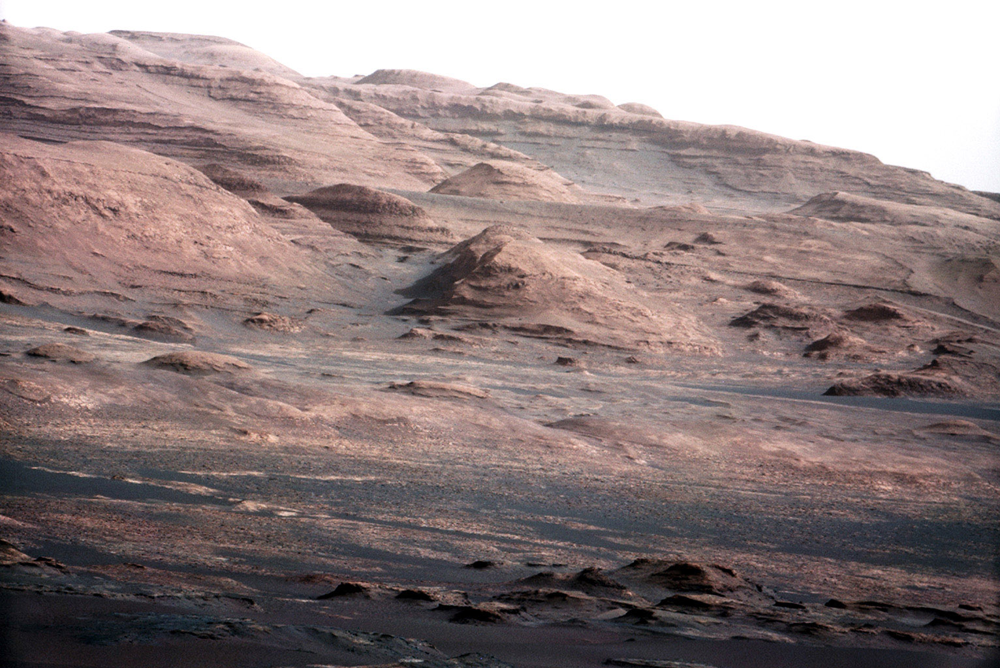

A Close Up Image of Layers at the Base of Mount Sharp Taken by the Mars Curiosity Rover


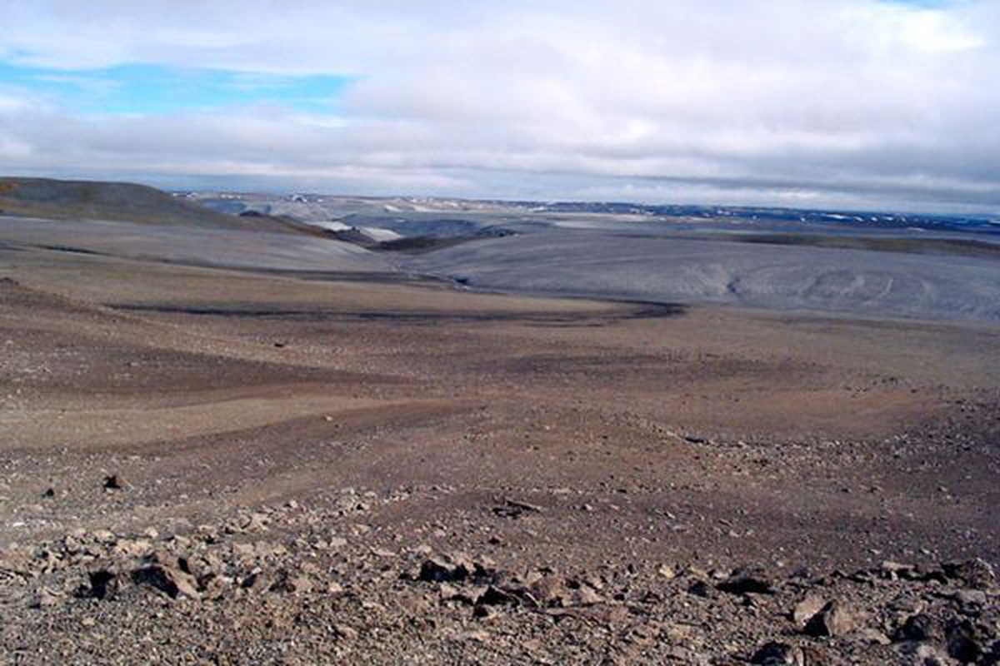

The Landscape of Devon Island, Canada


In [6]:
display_mars_surface() #call function to print image of the Martian surface
print('A Close Up Image of Layers at the Base of Mount Sharp Taken by the Mars Curiosity Rover')
display_devon_island() #call function to print image of the Devon Island, Canada for comparison
print('The Landscape of Devon Island, Canada')

# Loss of the Martian Atmosphere

It is believed by some scientists that Mars, quite possibly, had an atmosphere similar to ours here on Earth, with a presence of liquid water. Over time however, this atmosphere reduced to form Mars' thin atmosphere that we see today. To understand how this may have happened and how it is being investigated watch the following video clip.

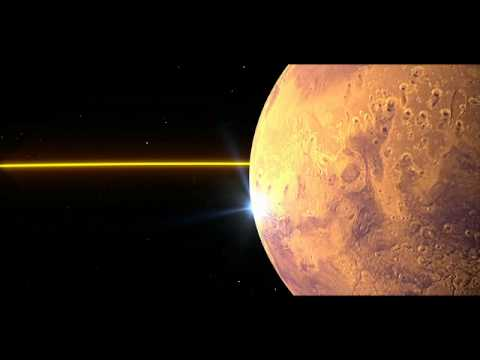

In [7]:
loss_of_mars_atmosphere() #call function to display YouTube video clip created by NASA of how Mars may have lost its atmosphere and how this is being investigated

# The Sounds of Mars

So far, we have seen what Mars looks like, but to further enhance our understandingof it, let's hear what it sounds like as recorded by the Insight Lander.

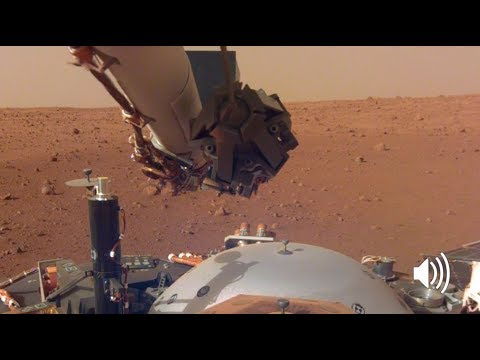

In [8]:
sounds_of_mars() #call function to display YouTube video of the first recordings of Martian winds.

# Mars Curiosity Rover

One of the vehicles currently monitoring the Martian atmosphere is the Mars Curiosity Rover, Curiosity was launched from Cape Canaveral on November 26, 2011, at 15:02 UTC and landed on Aeolis Palus inside Gale on Mars on August 6, 2012, 05:17 UTC. NASA states the aim of the mission is as follows: 'The Mars Science Laboratory mission and its Curiosity rover mark a transition between the themes of "Follow the Water" and "Seek Signs of Life." In addition to landing in a place with past evidence of water, Curiosity is seeking evidence of organics, the chemical building blocks of life. Places with water and the chemistry needed for life potentially provide habitable conditions. This mission is part of a series of expeditions to the red planet that help meet the four main science goals of the Mars Exploration Program: determine whether life ever arose on Mars, characterize the climate of Mars, characterize the geology of Mars, prepare for human exploration'.

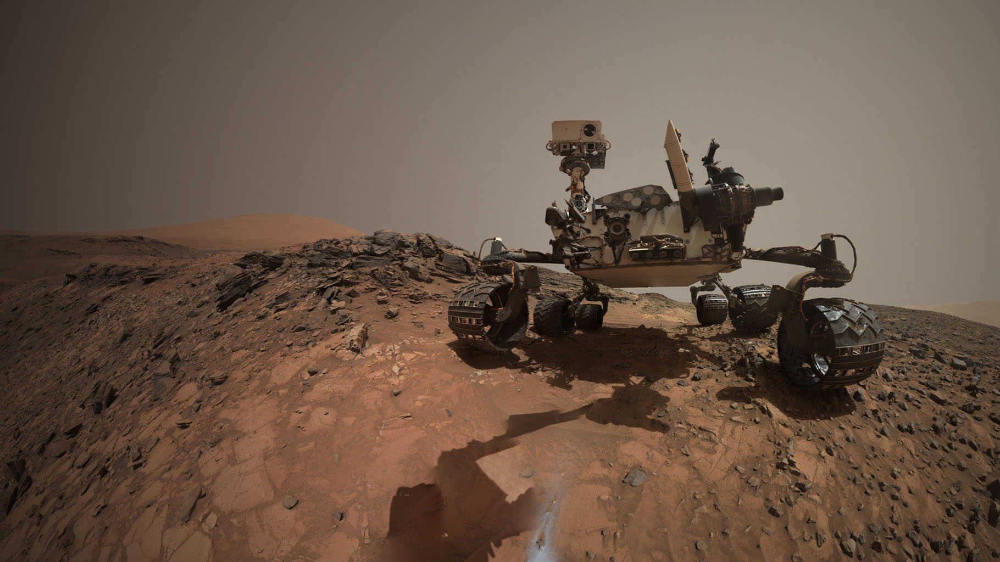

Mars Curiosity Rover Self Portrait


In [9]:
display_curiosity_self_portrait() #call function to display an image the Curiosity Rover took of itself
print('Mars Curiosity Rover Self Portrait')

# Curiosity Rover Equipment

The Mars Curiosity Rover has several onboard cameras, spectrometers, radiation detectors, environmental and atmospheric sensors. Each day the Curiosity Rover beams back huge quantities of information about its surroundings, helping us to form a greater understanding of the planet. Below are just a few of the many pictures the rover has taken from its 1500th sol (Mars day) on the planet since landing there.

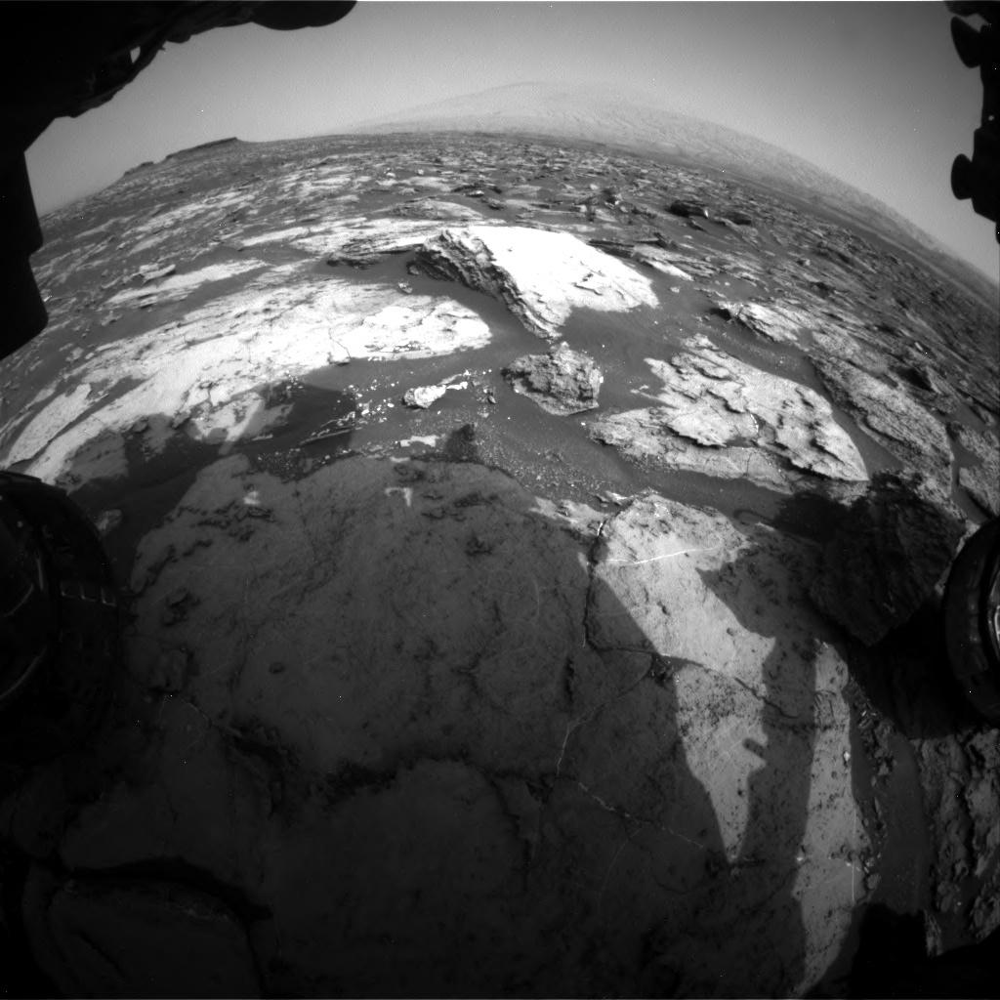

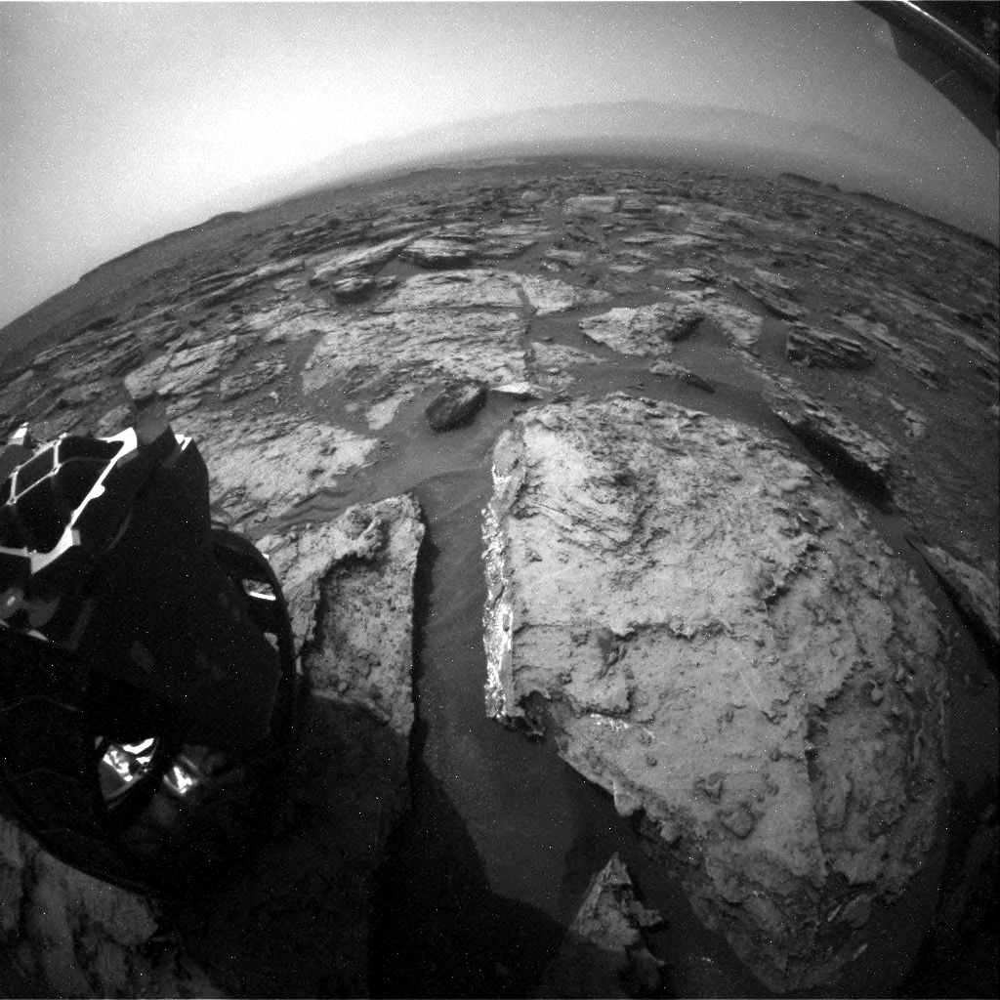

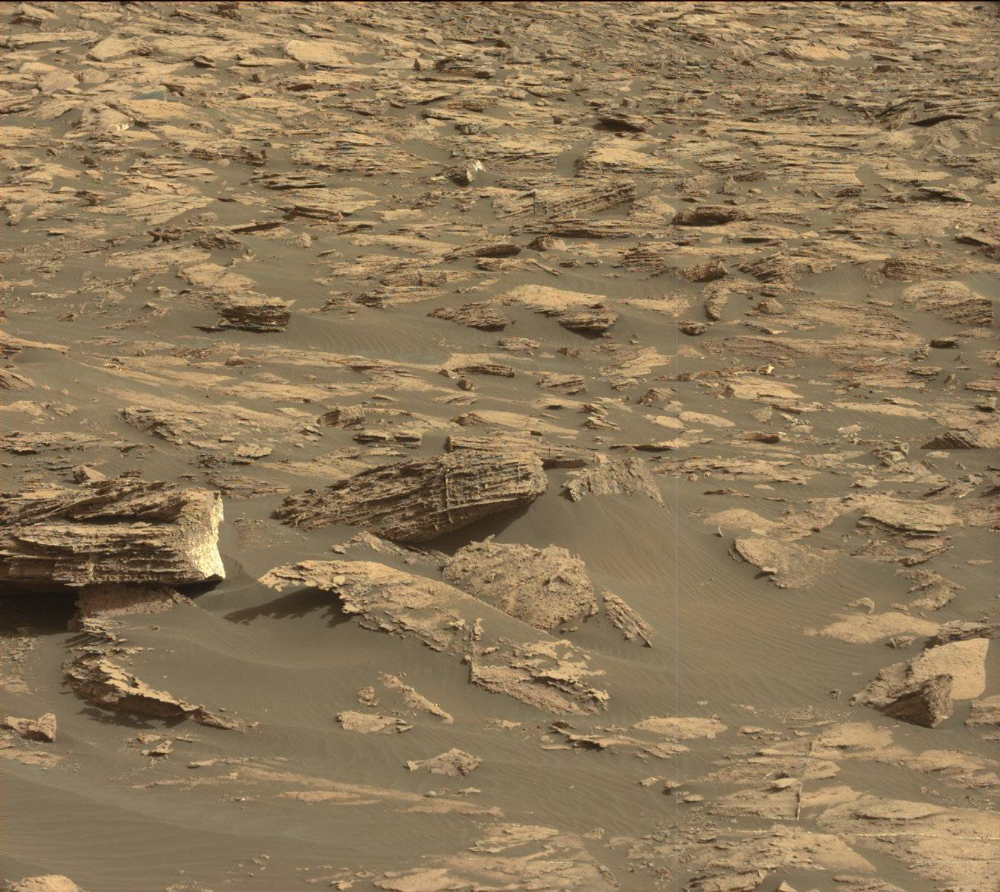

In [10]:
display_curiosity_images() #call function to display images taken from the Curiosty Rover using default input settings 

# Mars Atmospheric Conditions

# Get the Data

Let us now look and analyse all of the atmospheric data we can gather as recorded by the Mars Curiosity Rover (It is recommended to run this cell only once as it takes a while to check for information for each sol)

In [71]:
max_sol=get_max_sol() #find the maximum sol for which Curiosity Rover photos exist, this is likely the same for atmospheric data
mars_weather=get_mars_weather_data(max_sol) #call function to get weather data for specified period
save_as_csv(mars_weather) #save the dataframe to a csv with the default filepath

for sol 0 there is no data
for sol 1 there is no data
for sol 2 there is no data
for sol 3 there is no data
for sol 4 there is no data
for sol 5 there is no data
for sol 6 there is no data
for sol 7 there is no data
for sol 8 there is no data
for sol 9 there is no data
for sol 10 there is no data
for sol 11 there is no data
for sol 12 there is no data
for sol 13 there is no data
for sol 14 there is no data
for sol 15 there is no data
for sol 16 there is no data
for sol 17 there is no data
for sol 18 there is no data
for sol 19 there is no data
for sol 20 there is no data
for sol 21 there is no data
for sol 22 there is no data
for sol 23 there is no data
for sol 24 there is no data
for sol 25 there is no data
for sol 26 there is no data
for sol 27 there is no data
for sol 28 there is no data
for sol 29 there is no data
for sol 30 there is no data
for sol 31 there is no data
for sol 32 there is no data
for sol 33 there is no data
for sol 34 there is no data
for sol 35 there is no data
fo

for sol 287 there is no data
for sol 288 there is no data
for sol 289 there is no data
for sol 290 there is no data
for sol 291 there is no data
for sol 292 there is no data
for sol 293 there is no data
for sol 294 there is no data
for sol 295 there is no data
for sol 296 there is no data
for sol 297 there is no data
for sol 298 there is no data
for sol 299 there is no data
for sol 300 there is no data
for sol 301 there is no data
for sol 302 there is no data
for sol 303 there is no data
for sol 304 there is no data
for sol 305 there is no data
for sol 306 there is no data
for sol 307 there is no data
for sol 308 there is no data
for sol 309 there is no data
for sol 310 there is no data
for sol 311 there is no data
for sol 312 there is no data
for sol 313 there is no data
for sol 314 there is no data
for sol 315 there is no data
for sol 316 there is no data
for sol 317 there is no data
for sol 318 there is no data
for sol 319 there is no data
for sol 320 there is no data
for sol 321 th

for sol 665 there is no data
for sol 666 there is no data
for sol 667 there is no data
for sol 668 there is no data
for sol 669 there is no data
for sol 670 there is no data
for sol 671 there is no data
for sol 672 there is no data
for sol 673 there is no data
for sol 674 there is no data
for sol 675 there is no data
for sol 676 there is no data
for sol 677 there is no data
for sol 678 there is no data
for sol 679 there is no data
for sol 680 there is no data
for sol 681 there is no data
for sol 682 there is no data
for sol 683 there is no data
for sol 684 there is no data
for sol 685 there is no data
for sol 686 there is no data
for sol 687 there is no data
for sol 688 there is no data
for sol 689 there is no data
for sol 690 there is no data
for sol 691 there is no data
for sol 692 there is no data
for sol 693 there is no data
for sol 694 there is no data
for sol 695 there is no data
for sol 696 there is no data
for sol 697 there is no data
for sol 698 there is no data
for sol 699 th

for sol 948 there is no data
for sol 949 there is no data
for sol 950 there is no data
for sol 951 there is no data
for sol 952 there is no data
for sol 953 there is no data
for sol 954 there is no data
for sol 955 there is no data
for sol 956 there is no data
for sol 957 there is no data
for sol 958 there is no data
for sol 959 there is no data
for sol 960 there is no data
for sol 961 there is no data
for sol 962 there is no data
for sol 963 there is no data
for sol 964 there is no data
for sol 965 there is no data
for sol 966 there is no data
for sol 967 there is no data
for sol 968 there is no data
for sol 969 there is no data
for sol 970 there is no data
for sol 971 there is no data
for sol 972 there is no data
for sol 973 there is no data
for sol 974 there is no data
for sol 975 there is no data
for sol 976 there is no data
for sol 977 there is no data
for sol 978 there is no data
for sol 979 there is no data
for sol 980 there is no data
for sol 981 there is no data
for sol 982 th

for sol 1223 there is no data
for sol 1224 there is no data
for sol 1225 there is no data
for sol 1226 there is no data
for sol 1227 there is no data
for sol 1228 there is no data
for sol 1229 there is no data
for sol 1230 there is no data
for sol 1231 there is no data
for sol 1232 there is no data
for sol 1233 there is no data
for sol 1234 there is no data
for sol 1235 there is no data
for sol 1236 there is no data
for sol 1237 there is no data
for sol 1238 there is no data
for sol 1239 there is no data
for sol 1240 there is no data
for sol 1241 there is no data
for sol 1242 there is no data
for sol 1243 there is no data
for sol 1244 there is no data
for sol 1245 there is no data
for sol 1246 there is no data
for sol 1247 there is no data
for sol 1248 there is no data
for sol 1249 there is no data
for sol 1250 there is no data
for sol 1251 there is no data
for sol 1252 there is no data
for sol 1253 there is no data
for sol 1254 there is no data
for sol 1255 there is no data
for sol 12

for sol 1497 there is no data
for sol 1498 there is no data
for sol 1499 there is no data
for sol 1500 there is no data
for sol 1501 there is no data
for sol 1502 there is no data
for sol 1503 there is no data
for sol 1504 there is no data
for sol 1505 there is no data
for sol 1506 there is no data
for sol 1507 there is no data
for sol 1508 there is no data
for sol 1509 there is no data
for sol 1510 there is no data
for sol 1511 there is no data
for sol 1512 there is no data
for sol 1513 there is no data
for sol 1514 there is no data
for sol 1515 there is no data
for sol 1516 there is no data
for sol 1517 there is no data
for sol 1518 there is no data
for sol 1519 there is no data
for sol 1520 there is no data
for sol 1521 there is no data
for sol 1522 there is no data
for sol 1523 there is no data
for sol 1524 there is no data
for sol 1525 there is no data
for sol 1526 there is no data
for sol 1527 there is no data
for sol 1528 there is no data
for sol 1529 there is no data
for sol 15

for sol 1771 there is no data
for sol 1772 there is no data
for sol 1773 there is no data
for sol 1774 there is no data
for sol 1775 there is no data
for sol 1776 there is no data
for sol 1777 there is no data
for sol 1778 there is no data
for sol 1779 there is no data
for sol 1780 there is no data
for sol 1781 there is no data
for sol 1782 there is no data
for sol 1783 there is no data
for sol 1784 there is no data
for sol 1785 there is no data
for sol 1786 there is no data
for sol 1787 there is no data
for sol 1788 there is no data
for sol 1789 there is no data
for sol 1790 there is no data
for sol 1791 there is no data
for sol 1792 there is no data
for sol 1793 there is no data
for sol 1794 there is no data
for sol 1795 there is no data
for sol 1796 there is no data
for sol 1797 there is no data
for sol 1798 there is no data
for sol 1799 there is no data
for sol 1800 there is no data
for sol 1801 there is no data
for sol 1802 there is no data
for sol 1803 there is no data
for sol 18

for sol 2045 there is no data
for sol 2046 there is no data
for sol 2047 there is no data
for sol 2048 there is no data
for sol 2049 there is no data
for sol 2050 there is no data
for sol 2051 there is no data
for sol 2052 there is no data
for sol 2053 there is no data
for sol 2054 there is no data
for sol 2055 there is no data
for sol 2056 there is no data
for sol 2057 there is no data
for sol 2058 there is no data
for sol 2059 there is no data
for sol 2060 there is no data
for sol 2061 there is no data
for sol 2062 there is no data
for sol 2063 there is no data
for sol 2064 there is no data
for sol 2065 there is no data
for sol 2066 there is no data
for sol 2067 there is no data
for sol 2068 there is no data
for sol 2069 there is no data
for sol 2070 there is no data
for sol 2071 there is no data
for sol 2072 there is no data
for sol 2073 there is no data
for sol 2074 there is no data
for sol 2075 there is no data
for sol 2076 there is no data
for sol 2077 there is no data
for sol 20

for sol 2319 there is no data
for sol 2320 there is no data
for sol 2321 there is no data
for sol 2322 there is no data
for sol 2323 there is no data
for sol 2324 there is no data
for sol 2325 there is no data
for sol 2326 there is no data
for sol 2327 there is no data
for sol 2328 there is no data
for sol 2329 there is no data
for sol 2330 there is no data
for sol 2331 there is no data
for sol 2332 there is no data
for sol 2333 there is no data
for sol 2334 there is no data
for sol 2335 there is no data
for sol 2336 there is no data
for sol 2337 there is no data
for sol 2338 there is no data
for sol 2339 there is no data
for sol 2340 there is no data
for sol 2341 there is no data
for sol 2342 there is no data
for sol 2343 there is no data
for sol 2344 there is no data
for sol 2345 there is no data
for sol 2346 there is no data
for sol 2347 there is no data
for sol 2348 there is no data
for sol 2349 there is no data
for sol 2350 there is no data
for sol 2351 there is no data
for sol 23

By reading in the csv file and checking the length of the dataframe as done in the cell below, we see this API has provided an insufficient amount of data for analysis purposes. For this reason, a precompiled json document available at the following link was used: https://github.com/the-pudding/data/blob/master/mars-weather/README.md#mars-weathercsv 

In [11]:
mars_weather=pd.read_csv('mars_weather.csv', index_col=0) #read in csv file as saved previously 
print('Length of dataframe is ', len(mars_weather)) #check the length of the dataframe


Length of dataframe is  2107


In [12]:
mars_weather=get_mars_weather_data_take_2() #get data from precompiled json document
save_as_csv(mars_weather)#save dataframe again
mars_weather=pd.read_csv('mars_weather.csv', index_col=0)#upload csv as a pandas dataframe
print('Length of dataframe is ', len(mars_weather)) #check length of dataframe to ensure there is enough data for analysis purposes.
#This premade json file contains more data than was able to be collected through the API. For data analysis purposes, let us use this data. 

Length of dataframe is  2119


# Plot Minimum Temperature Data

Plot of Minimum Temperature below shows a strong seasonal component of the data.

Text(0.5,1,'Plot of Minimum Mars Temperature Across Martian Days')

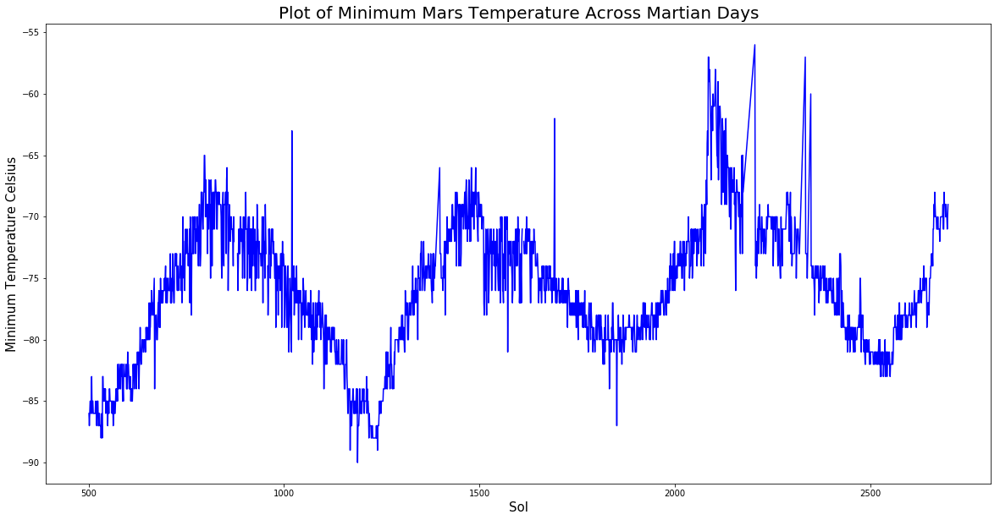

In [13]:
plt.figure(figsize=(20,10)) #state size of the figure
plt.plot(mars_weather.sol, mars_weather.air_temp_min, 'b') #plot minimum temp against sol in blue
plt.xlabel('Sol', fontsize=15) #label axes
plt.ylabel('Minimum Temperature Celsius', fontsize=15)
plt.title('Plot of Minimum Mars Temperature Across Martian Days', fontsize=20)

A histogram of the data indicates the distribution is mostly normal and skewed slightly right

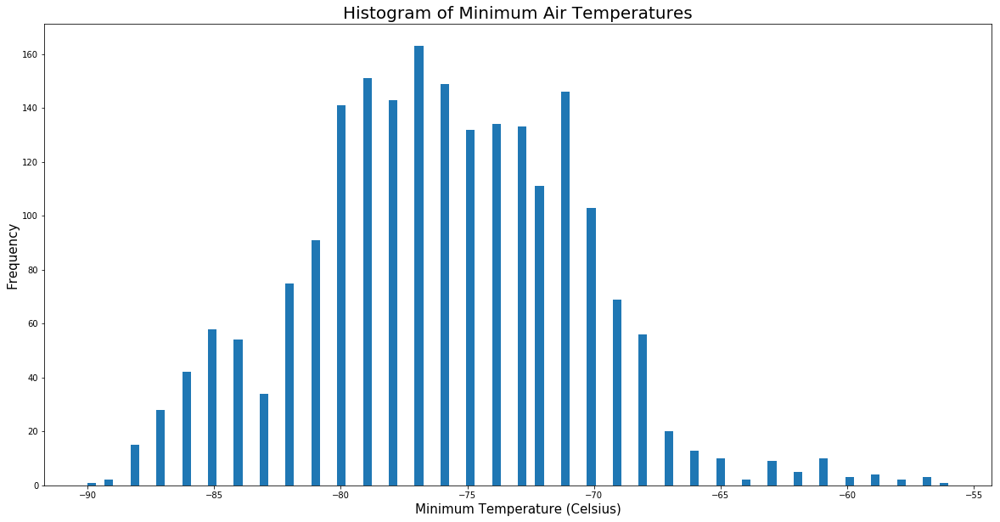

In [14]:
plt.figure(figsize=(20,10)) #state size of the figure
array_min_temp=mars_weather.air_temp_min.dropna() #create array with NaN values removed
plt.hist(array_min_temp, bins=100) #create histogram from data with 100 bins
plt.title('Histogram of Minimum Air Temperatures', fontsize=20)
plt.ylabel('Frequency', fontsize=15)
plt.xlabel('Minimum Temperature (Celsius)', fontsize=15)
plt.show()

#  Plot Maximum Temperature Data

Like with Minimum Temperature a plot of Maximum Temperature below shows a strong seasonal component of the data.

Text(0.5,1,'Plot of Maximum Mars Temperature Across Martian Days')

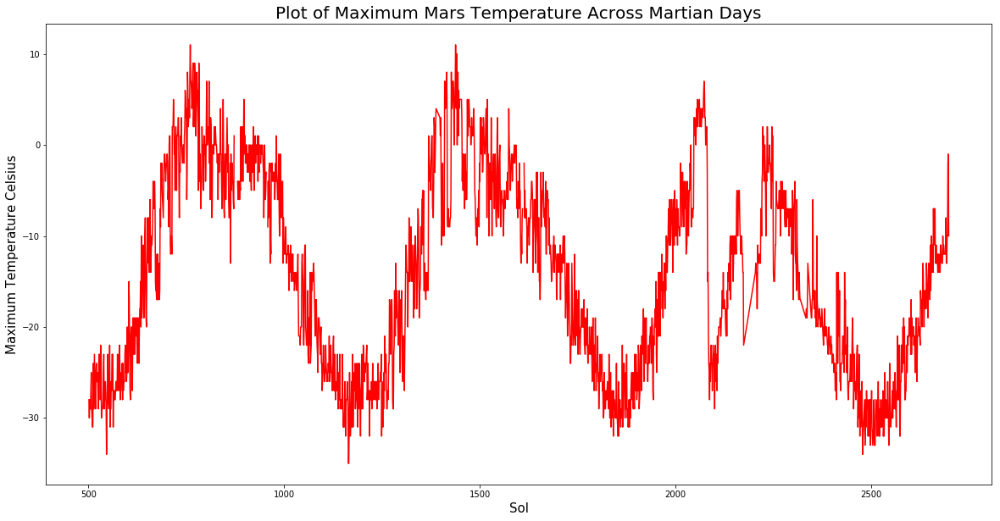

In [15]:
plt.figure(figsize=(20,10)) #state size of the figure
plt.plot(mars_weather.sol, mars_weather.air_temp_max, 'r') #plot maximum temp against sol in red
plt.xlabel('Sol', fontsize=15) #label axes
plt.ylabel('Maximum Temperature Celsius', fontsize=15)
plt.title('Plot of Maximum Mars Temperature Across Martian Days', fontsize=20)

A histogram of the Maximum Temperature Data indicates it is closer to that of a bimodal distribution.

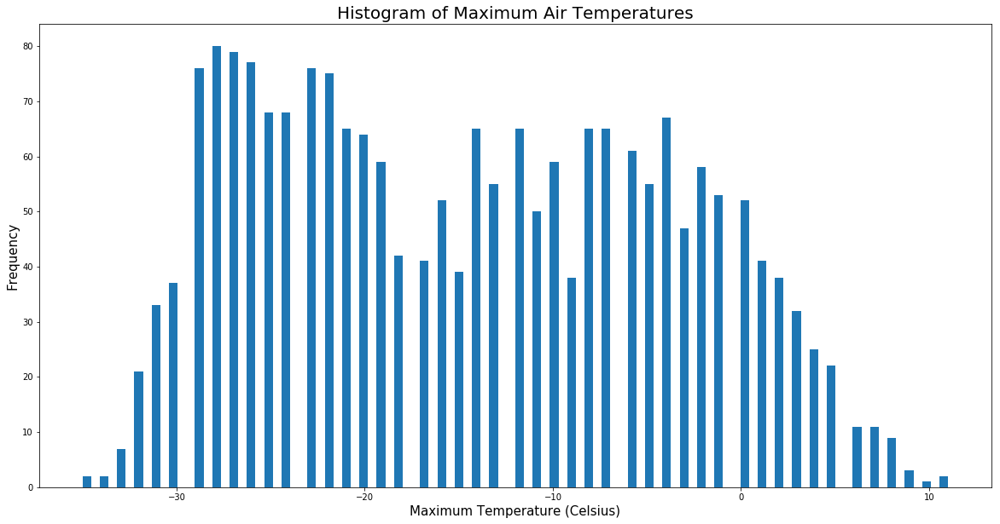

In [16]:
plt.figure(figsize=(20,10)) #state size of the figure
array_max_temp=mars_weather.air_temp_max.dropna() #create array with NaN values removed
plt.hist(array_max_temp, bins=100) #create histogram from data with 100 bins
plt.title('Histogram of Maximum Air Temperatures', fontsize=20)
plt.ylabel('Frequency', fontsize=15)
plt.xlabel('Maximum Temperature (Celsius)', fontsize=15)
plt.show()

# Maximum Temperatures vs Minimum Temperatures

Below, the distribution characteristics for the minimum temperatures recorded are described. It is found that the standard deviation with regards to mimimum temperatures recorded is almost half that of the standard deviation of maximum temperatures recorded. We would expect this result based on the shape of the histograms created from the two datasets, minimum temperatures are more heavily concentrated towards the mean as opposed to maximum temperatures which are more spread out and nearly closer to that of a bimodal distribution. We also see a much greater interquartile range for maximum temperatures than minimum temperatures.

In [17]:
print("Minimum Temperatures Recorded \n\n", array_min_temp.describe(),'\n', 'Interquartile Range is: ', iqr(array_min_temp), '\n\n')
print("Maximum Temperatures Recorded \n\n", array_max_temp.describe(),'\n', 'Interquartile Range is: ', iqr(array_max_temp))
print( iqr(array_max_temp))

Minimum Temperatures Recorded 

 count    2113.000000
mean      -75.990062
std         5.357255
min       -90.000000
25%       -80.000000
50%       -76.000000
75%       -72.000000
max       -56.000000
Name: air_temp_min, dtype: float64 
 Interquartile Range is:  8.0 


Maximum Temperatures Recorded 

 count    2113.000000
mean      -14.435873
std        10.632675
min       -35.000000
25%       -24.000000
50%       -15.000000
75%        -6.000000
max        11.000000
Name: air_temp_max, dtype: float64 
 Interquartile Range is:  18.0
18.0


As we can see from the previous two timeseries graphs, minimum and maximum temperatures recorded for each martian day follow each other quite closely. In both there is a clear seasonal component. To get an idea of how strong the relationship is between these two variables, let's have a look at their correlation coefficient.

In [18]:
print('Pearson correlation coefficient between Mars minimum and maximum daily temperature is %.3f' %(pearsonr(mars_weather.dropna().air_temp_min, mars_weather.dropna().air_temp_max)[0]))
print('P-value is %.3f'%(pearsonr(mars_weather.dropna().air_temp_min, mars_weather.dropna().air_temp_max)[1]))

Pearson correlation coefficient between Mars minimum and maximum daily temperature is 0.656
P-value is 0.000


As the Pearson correlation coefficient lies between 0.5 and 1 we can determine there is a moderate to strong positive relationship, this relationship is statistically significant with a P-value of 0.000.

Next, let us explore how much the difference between maximum and minimum temperatures varies over time. Again, we see a strong seasonality in the data.

Text(0.5,1,'Plot of Difference in Maximum and Minimum Temperatures Across Martian Days')

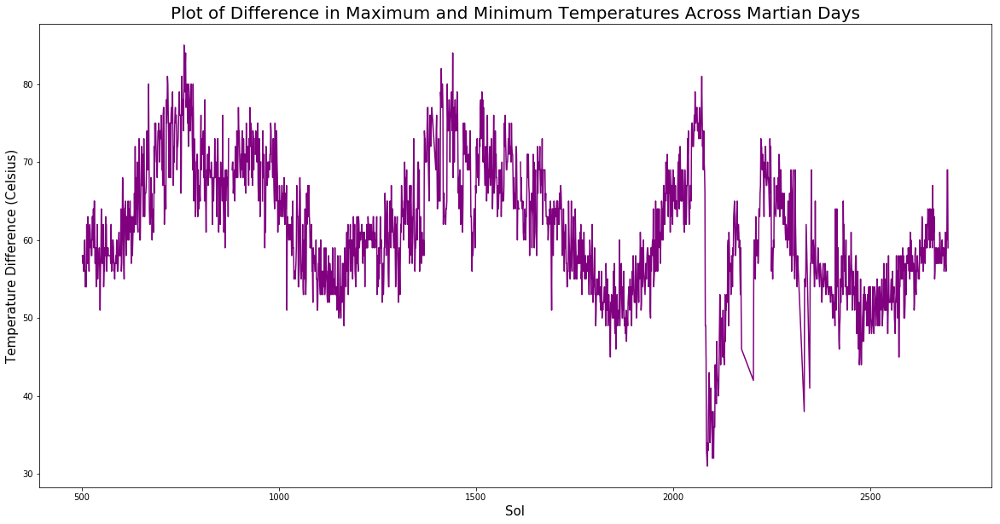

In [19]:
mars_weather['temp_diff']=mars_weather.air_temp_max-mars_weather.air_temp_min #create new column with difference between maximum and minimum air temperatures each sol
plt.figure(figsize=(20,10)) #state size of the figure
plt.plot(mars_weather.sol, mars_weather.temp_diff, color='purple') #plot this difference over time in purple
plt.xlabel('Sol',fontsize=15) #label axes
plt.ylabel('Temperature Difference (Celsius)', fontsize=15)
plt.title('Plot of Difference in Maximum and Minimum Temperatures Across Martian Days', fontsize=20)


To understand the distribution of temperature difference, let us next analyse a histogram of the data. It is found the data presents a fairly normal distribution that is slightly skewed left.

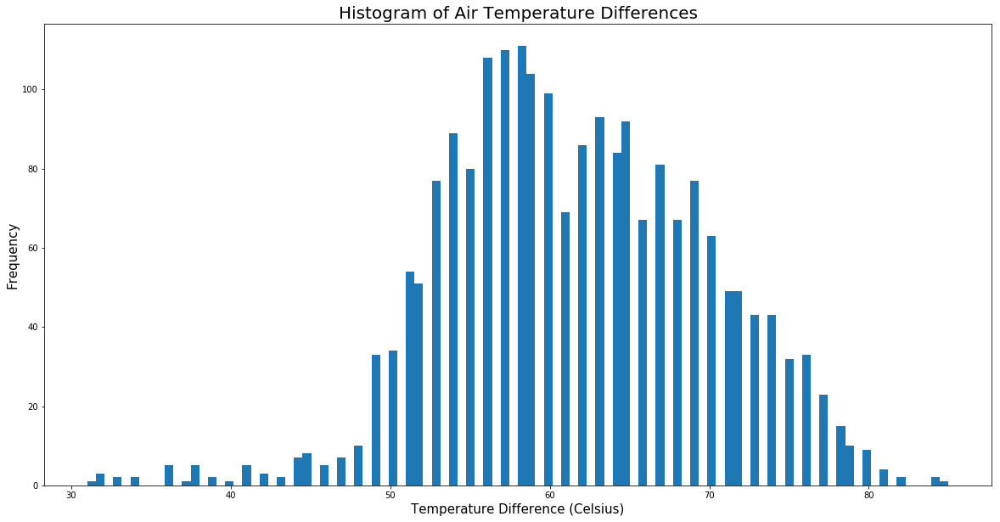

In [20]:
plt.figure(figsize=(20,10)) #state size of the figure
array_temp_diff=mars_weather.temp_diff.dropna() #create array with NaN values removed
plt.hist(array_temp_diff, bins=100) #create histogram from data with 100 bins
plt.title('Histogram of Air Temperature Differences', fontsize=20)
plt.ylabel('Frequency', fontsize=15)
plt.xlabel('Temperature Difference (Celsius)', fontsize=15)
plt.show()

# Plot Pressure Data

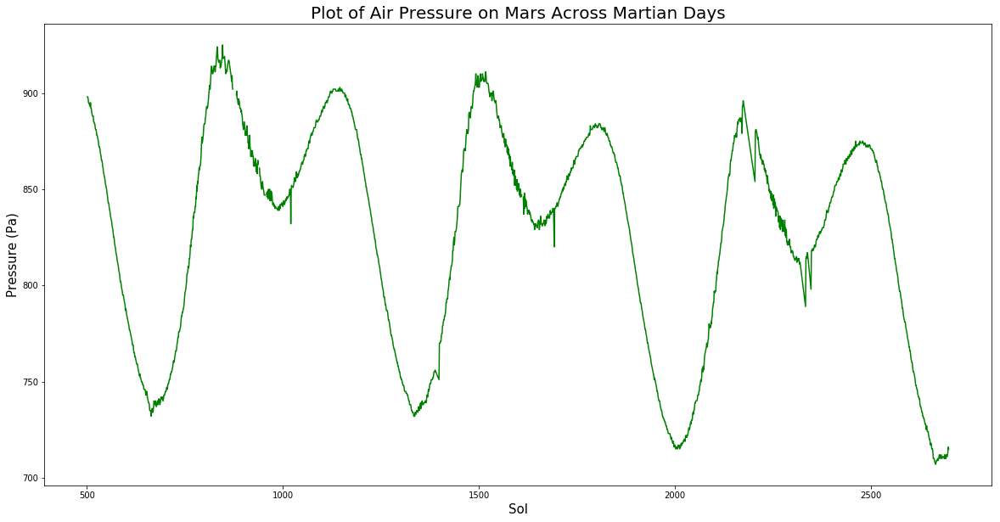

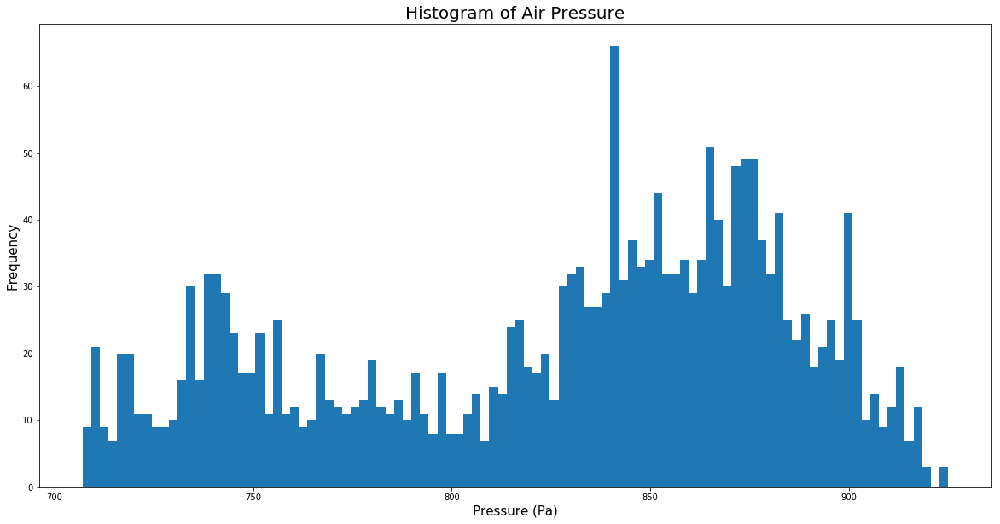

In [21]:
plt.figure(figsize=(20,10)) #state size of the figure
plt.plot(mars_weather.sol, mars_weather.pressure, 'g') #plot pressure against sol in green
plt.xlabel('Sol', fontsize=15) #label axes
plt.ylabel('Pressure (Pa)', fontsize=15)
plt.title('Plot of Air Pressure on Mars Across Martian Days', fontsize=20)
plt.show()
plt.figure(figsize=(20,10)) #state size of the figure
plt.hist(mars_weather.pressure.dropna(), bins=100)#drop NaN values from column of pressure values and create histogram with 100 bins
plt.title('Histogram of Air Pressure', fontsize=20)
plt.ylabel('Frequency', fontsize=15)#label axes
plt.xlabel('Pressure (Pa)', fontsize=15)
plt.show()

There is clearly a strong seasonal component in the data and a general downward trend. The timeseries graph looks somewhat dissimilar to those for minimum and maximum temperature, however the histogram, like the histogram for maximum temperatures indicates a bimodal distribution. Let's check the strength of their linear relationship again using the Pearson Correlation Coefficient.

In [22]:
print('Pearson correlation coefficient between Mars pressure and minimum daily temperature is %.3f' %(pearsonr(mars_weather.dropna().pressure, mars_weather.dropna().air_temp_min)[0]))
print('P-value is %.3f'%(pearsonr(mars_weather.dropna().pressure, mars_weather.dropna().air_temp_min)[1]))
print('Pearson correlation coefficient between Mars pressure and maximum daily temperature is %.3f' %(pearsonr(mars_weather.dropna().pressure, mars_weather.dropna().air_temp_max)[0]))
print('P-value is %.3f'%(pearsonr(mars_weather.dropna().pressure, mars_weather.dropna().air_temp_max)[1]))

Pearson correlation coefficient between Mars pressure and minimum daily temperature is -0.034
P-value is 0.124
Pearson correlation coefficient between Mars pressure and maximum daily temperature is -0.091
P-value is 0.000


These results show little to indicate a significant linear relationship between pressure and temperature, however in the case of Mars pressure and maximum temperature, the p-value is greater than the significance level of 0.05 so there is inconclusive evidence about the significance of the association between these two variables.

Next, let's see if there is any monthly trend in the data.

# Monthly Trends

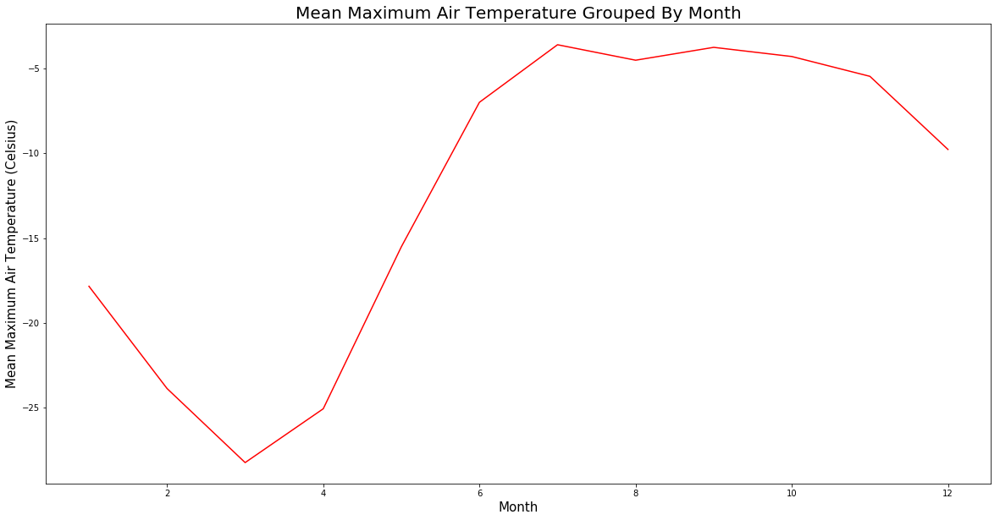

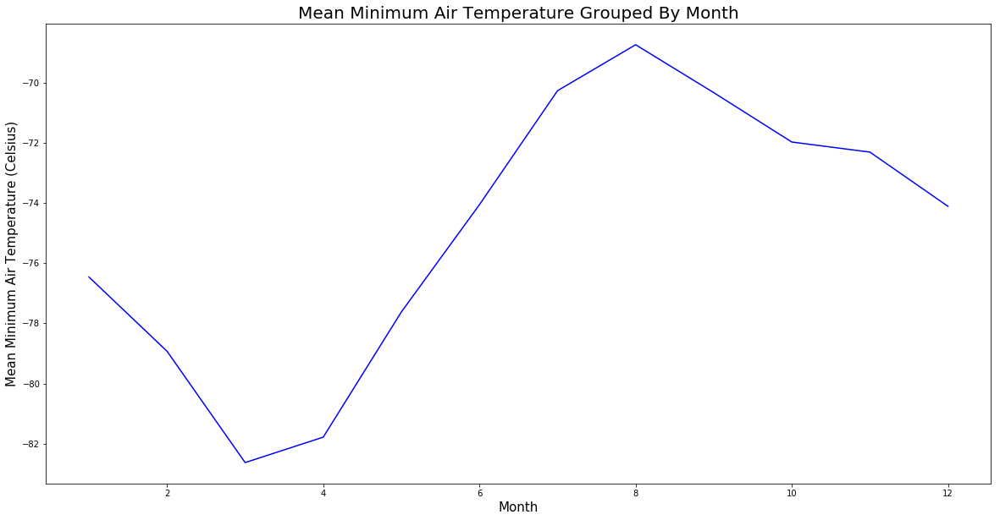

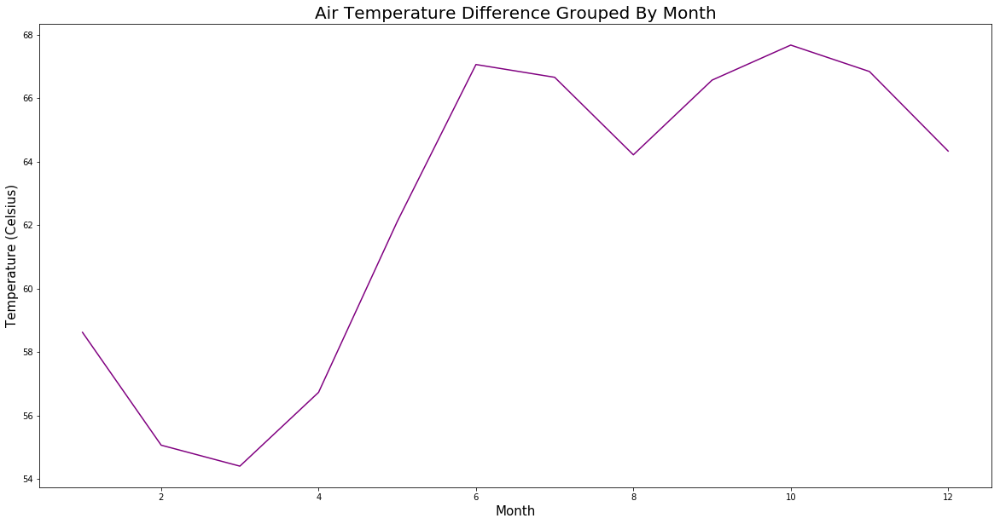

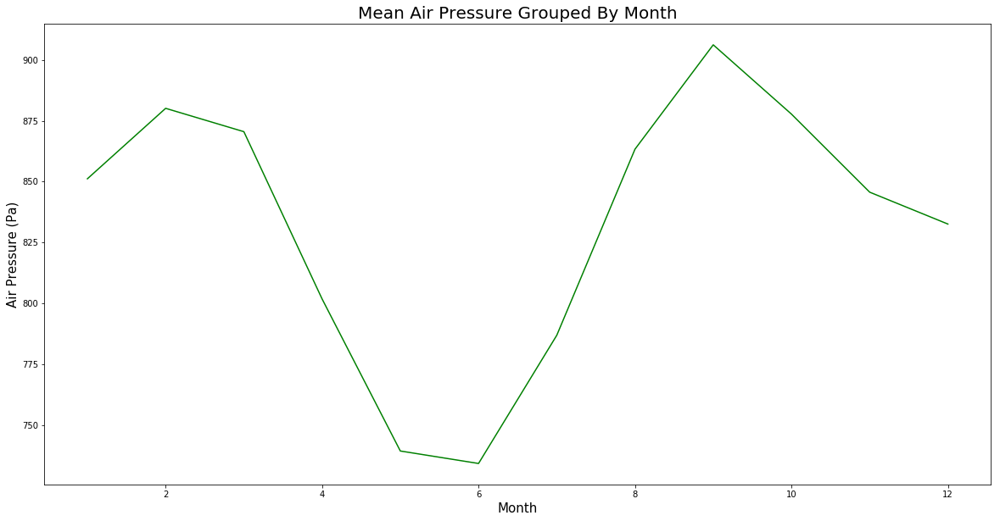

In [23]:
grouped_by_month=mars_weather.groupby('month').mean() #for each month, find the mean value of each of the columns in the df
plt.figure(figsize=(20, 10))
plt.plot(grouped_by_month.index, grouped_by_month.air_temp_max, 'r') #plot mean air temp max grouped by month in red
plt.title('Mean Maximum Air Temperature Grouped By Month', fontsize=20)
plt.xlabel('Month', fontsize=15)
plt.ylabel('Mean Maximum Air Temperature (Celsius)', fontsize=15)
plt.show()
plt.figure(figsize=(20, 10))
plt.plot(grouped_by_month.index, grouped_by_month.air_temp_min, 'b') #plot mean air temp min grouped by month in blue
plt.title('Mean Minimum Air Temperature Grouped By Month', fontsize=20)
plt.xlabel('Month', fontsize=15)
plt.ylabel('Mean Minimum Air Temperature (Celsius)', fontsize=15)
plt.show()
plt.figure(figsize=(20, 10))
plt.plot(grouped_by_month.index, grouped_by_month.temp_diff, color='purple') #plot mean pressure temp max grouped by month in green
plt.title('Air Temperature Difference Grouped By Month', fontsize=20)
plt.xlabel('Month', fontsize=15)
plt.ylabel('Temperature (Celsius)', fontsize=15)
plt.show()
plt.figure(figsize=(20, 10))
plt.plot(grouped_by_month.index, grouped_by_month.pressure, 'g') #plot mean pressure temp max grouped by month in green
plt.title('Mean Air Pressure Grouped By Month', fontsize=20)
plt.xlabel('Month', fontsize=15)
plt.ylabel('Air Pressure (Pa)', fontsize=15)
plt.show()


# Comparison With Earth

From the above plotted data we can see Mars is a lot colder than what we are used to on Earth with much less atmospheric presure too. For a little comparison with our environment here on earth let us compare Mars' average weather conditions with our own.

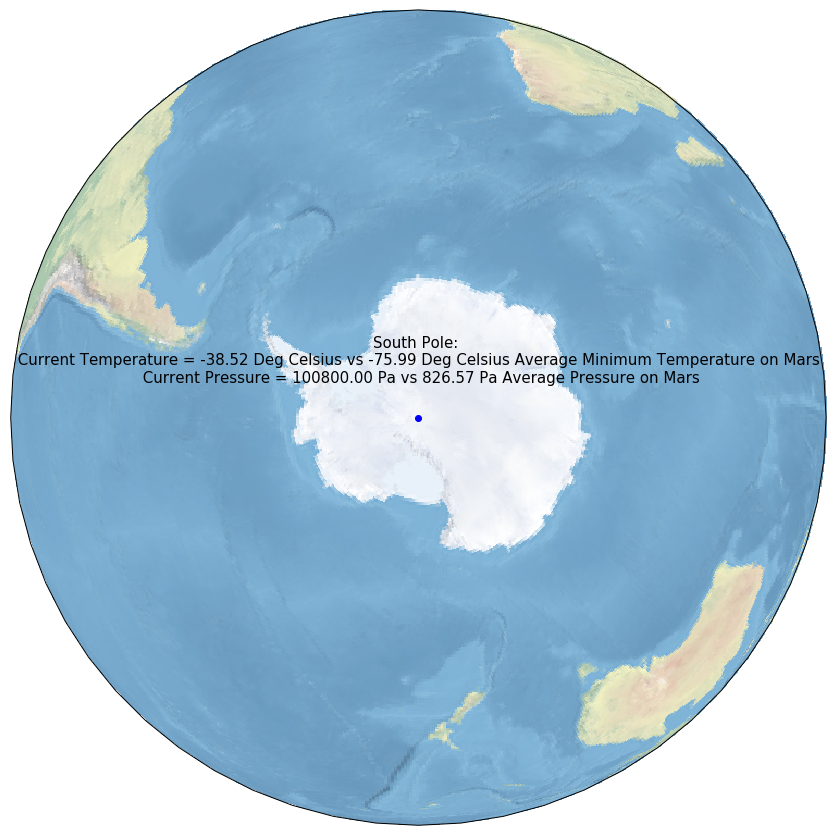

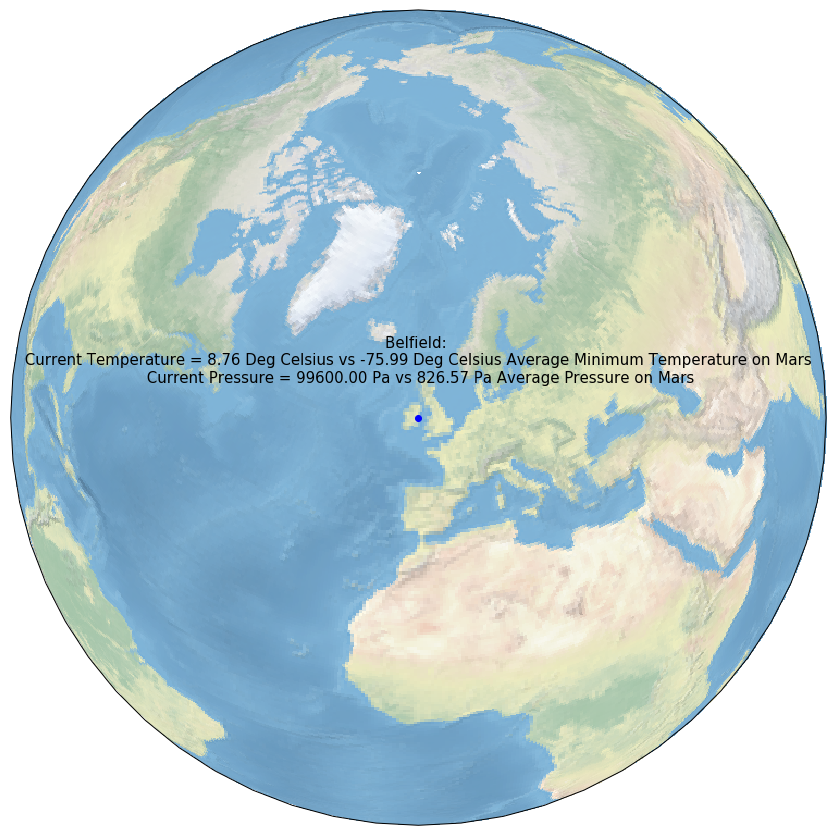

In [128]:
avg_mars_min_temp=mars_weather.air_temp_min.mean()
avg_mars_pressure=mars_weather.pressure.mean()

#comparison with the South Pole
south_pole_lat, south_pole_lon= -90, 0
get_locational_current_temp_and_compare(south_pole_lat, south_pole_lon, 'South Pole', avg_mars_min_temp, avg_mars_pressure, 'Mars')

#comparison with Belfield
Belfield_lat, Belfield_lon= 53.305076, -6.215016
get_locational_current_temp_and_compare(Belfield_lat, Belfield_lon, 'Belfield', avg_mars_min_temp, avg_mars_pressure, 'Mars')

Undoubtedly there are stark differences between environmental conditions on Mars and on Earth which adds an additional frontier to overcome in our mission to inhabit the planet.